In [1]:
import sys
sys.path.insert(0, '..')

In [ ]:
# Basic imports
import jax.numpy as np
import jax.random as jr
import jax.scipy as jsp
import jax
import numpy

#jax.config.update("jax_log_compiles", True)
#jax.config.update("jax_explain_cache_misses", True)

jax.config.update("jax_enable_x64", True)

# Optimisation imports
import zodiax as zdx
import optax

import optimistix as optx

# dLux imports
import dLux as dl
import dLux.utils as dlu

#jax.config.update("jax_enable_x64", True)

from sklearn.decomposition import PCA

# Visualisation imports
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import matplotlib

%matplotlib inline
plt.rcParams['image.cmap'] = 'inferno'
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = 'lower'
plt.rcParams['figure.dpi'] = 72
plt.rcParams["font.size"] = 24

from detectors import *
from apertures import *
from models import *
from stats import posterior
from fitting import *
from plotting import *

def set_array(pytree):
    dtype = np.float64 if jax.config.x64_enabled else np.float32
    floats, other = eqx.partition(pytree, eqx.is_inexact_array_like)
    floats = jtu.tree_map(lambda x: np.array(x, dtype=dtype), floats)
    return eqx.combine(floats, other)

In [3]:
extra_bad = None
#extra_bad = np.isnan(np.zeros((64, 64)).at[35,60].set(np.nan))

#extra_bad = np.isnan(np.zeros((wid,wid))).at[wid//2-3:wid//2+3,:].set(np.nan)


In [4]:
wid = 64#64
oversample = 4

nwavels = 3
npoly=1

n_zernikes = 26#12-1#12-1

optics = NICMOSSecondaryFresnelOptics(512, wid, oversample, mag=3.3, defocus=0., despace=0., n_zernikes = n_zernikes)

detector = NICMOSDetector(oversample, wid)

In [5]:
data = '../data/MAST_2025-06-26T06_57_47.174Z/HST/'

files = """
na2m01k7q_cal.fits
na2m01k8q_cal.fits
na2m01k9q_cal.fits
na2m01kaq_cal.fits
na2m01kbq_cal.fits
na2m01kcq_cal.fits
na2m01kdq_cal.fits
na2m01keq_cal.fits
na2m01kfq_cal.fits
na2m01kgq_cal.fits
na2m01kiq_cal.fits
na2m01kjq_cal.fits
na2m01kkq_cal.fits
na2m01klq_cal.fits
na2m01kmq_cal.fits
na2m01knq_cal.fits
na2m01koq_cal.fits
na2m01kpq_cal.fits
na2m01kqq_cal.fits
na2m01krq_cal.fits
na2m01ksq_cal.fits
na2m01ktq_cal.fits
na2m01kuq_cal.fits
na2m01kvq_cal.fits
na2m01kwq_cal.fits
na2m01kyq_cal.fits
na2m01kzq_cal.fits
na2m01l0q_cal.fits
na2m01l1q_cal.fits
na2m01l2q_cal.fits
na2m01l3q_cal.fits
na2m01l4q_cal.fits
na2m01l5q_cal.fits
na2m01l6q_cal.fits
na2m01l7q_cal.fits
na2m01l8q_cal.fits
na2m01l9q_cal.fits
na2m01laq_cal.fits
na2m01lbq_cal.fits
na2m01lcq_cal.fits
na2m01leq_cal.fits
na2m01lfq_cal.fits
na2m01lgq_cal.fits
na2m01lhq_cal.fits
na2m01liq_cal.fits
na2m01ljq_cal.fits
na2m01lkq_cal.fits
na2m01llq_cal.fits
na2m01lmq_cal.fits
na2m01lnq_cal.fits
na2m01loq_cal.fits
na2m01lpq_cal.fits
na2m01lqq_cal.fits
na2m01lrq_cal.fits
na2m01lsq_cal.fits
na2m01luq_cal.fits
na2m01lvq_cal.fits
na2m01lwq_cal.fits
na2m01lxq_cal.fits
na2m01lyq_cal.fits
na2m01lzq_cal.fits
na2m01m0q_cal.fits
na2m01m1q_cal.fits
na2m01m2q_cal.fits
na2m01m3q_cal.fits
na2m01m4q_cal.fits
na2m01m5q_cal.fits
na2m01m6q_cal.fits
na2m01m7q_cal.fits
na2m01m8q_cal.fits
na2m01maq_cal.fits
na2m01mbq_cal.fits
na2m01mcq_cal.fits
na2m01mdq_cal.fits
na2m01meq_cal.fits
na2m01mfq_cal.fits
na2m01mgq_cal.fits
na2m01mhq_cal.fits
na2m01miq_cal.fits
na2m01mjq_cal.fits
na2m01mkq_cal.fits
na2m01mlq_cal.fits
na2m01mmq_cal.fits
na2m01mnq_cal.fits
na2m01moq_cal.fits
na2m01mqq_cal.fits
na2m01mrq_cal.fits
na2m01msq_cal.fits
na2m01mtq_cal.fits
na2m01muq_cal.fits
na2m01mvq_cal.fits
na2m01mwq_cal.fits
na2m01mxq_cal.fits
na2m01myq_cal.fits
na2m01mzq_cal.fits
na2m01n0q_cal.fits
na2m01n1q_cal.fits
na2m01n2q_cal.fits
na2m01n3q_cal.fits
na2m01n4q_cal.fits
""".split()[::5]#[:15]#[::10]#[:1]
#exposures_raw = [exposure_from_file(data + file, SinglePointFit(CombinedPolySpectrum, nwavels), crop=wid, extra_bad=extra_bad) for file in files]

spectrum_basis = np.ones((1, 3))

exposures_raw = [exposure_from_file(data + file, SinglePointFit(spectrum_basis, "F187N"), crop=wid) for file in files]


exposures_single = []
for exp in exposures_raw:
    if exp.data.shape == (wid, wid):
        exposures_single.append(exp)

106 91
106 91
106 91
106 91
106 91
106 91
106 91


/Users/haydengreer/UQ/Subjects/Semester 2 2024/PHYS3900/hubble/notebooks/../models.py:163: UserWarning: A JAX array is being set as static! This can result in unexpected behavior and is usually a mistake to do.
  return Exposure(filename, name, filter, tf(data), tf(err_with_poisson), tf(bad_with_poisson), fit, mjd, exptime, wcs, pam)
/Users/haydengreer/UQ/Subjects/Semester 2 2024/PHYS3900/hubble/notebooks/../models.py:163: UserWarning: A JAX array is being set as static! This can result in unexpected behavior and is usually a mistake to do.
  return Exposure(filename, name, filter, tf(data), tf(err_with_poisson), tf(bad_with_poisson), fit, mjd, exptime, wcs, pam)
/Users/haydengreer/UQ/Subjects/Semester 2 2024/PHYS3900/hubble/notebooks/../models.py:163: UserWarning: A JAX array is being set as static! This can result in unexpected behavior and is usually a mistake to do.
  return Exposure(filename, name, filter, tf(data), tf(err_with_poisson), tf(bad_with_poisson), fit, mjd, exptime, wc

106 91
106 91
106 91
106 91
106 91
106 91
106 91
106 91
106 91
106 91
106 91
106 91
106 91


/Users/haydengreer/UQ/Subjects/Semester 2 2024/PHYS3900/hubble/notebooks/../models.py:163: UserWarning: A JAX array is being set as static! This can result in unexpected behavior and is usually a mistake to do.
  return Exposure(filename, name, filter, tf(data), tf(err_with_poisson), tf(bad_with_poisson), fit, mjd, exptime, wcs, pam)
/Users/haydengreer/UQ/Subjects/Semester 2 2024/PHYS3900/hubble/notebooks/../models.py:163: UserWarning: A JAX array is being set as static! This can result in unexpected behavior and is usually a mistake to do.
  return Exposure(filename, name, filter, tf(data), tf(err_with_poisson), tf(bad_with_poisson), fit, mjd, exptime, wcs, pam)
/Users/haydengreer/UQ/Subjects/Semester 2 2024/PHYS3900/hubble/notebooks/../models.py:163: UserWarning: A JAX array is being set as static! This can result in unexpected behavior and is usually a mistake to do.
  return Exposure(filename, name, filter, tf(data), tf(err_with_poisson), tf(bad_with_poisson), fit, mjd, exptime, wc

In [6]:
len(exposures_single)

20

In [7]:
for e in exposures_single:
    print(e.mjd*86400)
    print(e.exptime)
    print(e.target)
    print(e.filter)
    print((1.8-e.pam))#*0.0470)

4714991801.467776
3.996392
HD189733
F187N
2.330879
4714991866.464768
3.996392
HD189733
F187N
2.33584
4714991931.465216
3.996392
HD189733
F187N
2.330879
4714991996.466528
3.996392
HD189733
F187N
2.330879
4714992061.465248
3.996392
HD189733
F187N
2.325917
4714992126.464832
3.996392
HD189733
F187N
2.33584
4714992191.467008
3.996392
HD189733
F187N
2.33584
4714992256.464864
3.996392
HD189733
F187N
2.340802
4714992321.465312
3.996392
HD189733
F187N
2.340802
4714992386.467487
3.996392
HD189733
F187N
2.330879
4714992451.465344
3.996392
HD189733
F187N
2.325917
4714992516.466657
3.996392
HD189733
F187N
2.340802
4714992581.469696
3.996392
HD189733
F187N
2.33584
4714992646.468416
3.996392
HD189733
F187N
2.340802
4714992711.469728
3.996392
HD189733
F187N
2.340802
4714992776.472768
3.996392
HD189733
F187N
2.33584
4714992841.470624
3.996392
HD189733
F187N
2.33584
4714992906.471072
3.996392
HD189733
F187N
2.330879
4714992971.473248
3.996392
HD189733
F187N
2.340802
4714993036.471105
3.996392
HD189733
F

In [8]:
params = {
    #"fluxes": {},
    "positions": {},
    "spectrum": {},
    "aberrations": {},

    #"rot": 0.,

    "cold_mask_shift": {},
    "cold_mask_rot": {},
    "cold_mask_scale": {},
    "cold_mask_shear": {},
    "primary_scale": {},
    "primary_rot": {},
    "primary_shear": {},
    "outer_radius": 1.2*0.955,
    "secondary_radius": 0.372*1.2,
    "spider_width": 0.077*1.2,
    "scale": 0.0432,

    "softening": 2.,#0.1,
    "bias": {},
    "jitter": {},
    "defocus": {},#1e5#{}
    "despace": {},
    "mag": 3.3,
}

for exp in exposures_single:
    params["positions"][exp.fit.get_key(exp, "positions")] = np.asarray([0.,0.])
    params["spectrum"][exp.fit.get_key(exp, "spectrum")] = np.log10(np.nansum(exp.data)/3)-3#np.zeros(npoly).at[0].set(1)*np.log10(np.nansum(exp.data)/nwavels/0.3)
    params["aberrations"][exp.fit.get_key(exp, "aberrations")] = np.zeros(n_zernikes)
    params["cold_mask_shift"][exp.fit.get_key(exp, "cold_mask_shift")] = np.asarray([8., 8.])#*1e2
    params["cold_mask_rot"][exp.fit.get_key(exp, "cold_mask_rot")] = -45.
    params["cold_mask_scale"][exp.fit.get_key(exp, "cold_mask_scale")] = np.asarray([1.,1.])
    params["cold_mask_shear"][exp.fit.get_key(exp, "cold_mask_shear")] = np.asarray([0.,0.])
    params["primary_rot"][exp.fit.get_key(exp, "primary_rot")] = -45. + 90. #+ 180.
    params["primary_scale"][exp.fit.get_key(exp, "primary_scale")] = np.asarray([1.,1.])
    params["primary_shear"][exp.fit.get_key(exp, "primary_shear")] = np.asarray([0.,0.])
    params["defocus"][exp.fit.get_key(exp, "defocus")] = 0.233#2.4#800.#160.*20
    params["despace"][exp.fit.get_key(exp, "despace")] = 0.#2.4#800.#160.*20

    params["bias"][exp.fit.get_key(exp, "bias")] = 0.
    params["jitter"][exp.fit.get_key(exp, "jitter")] = 7/43*oversample


model_single = set_array(NICMOSModel(exposures_single, params, optics, detector))
#model_binary = set_array(NICMOSModel(exposures_binary, params, optics, detector))


params = ModelParams(params)

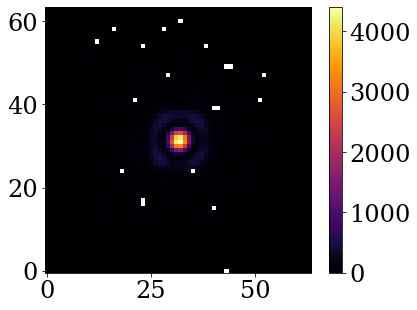

In [9]:
plt.imshow(exposures_single[0].data)
plt.colorbar()

In [10]:
np.nanmax(exposures_single[0].data)

Array(4408.81201172, dtype=float64)

6.930396887047471
7.057866655486928
6.679831706837602
6.797452959206156
6.604622322888582
6.9297728779516925
6.73853907321918
6.884997587619245
6.735504361349445
6.678808718146734
6.752342892285112
6.772304973622102
6.697038149681905
6.67732657530856
6.64138421809192
6.692735420794624
6.608816346869138
6.71686088014189
6.785260368813261
6.6447500815817895


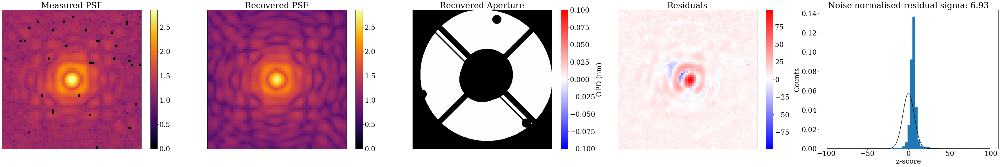

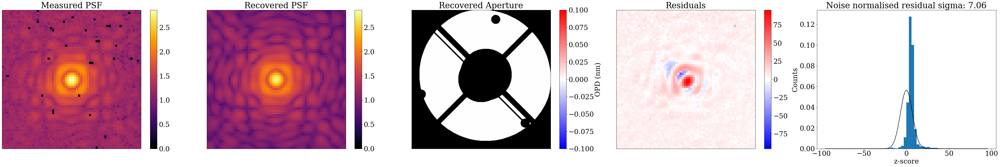

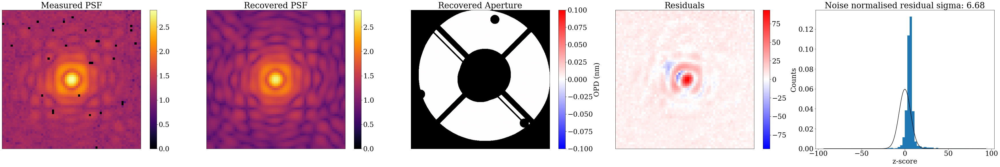

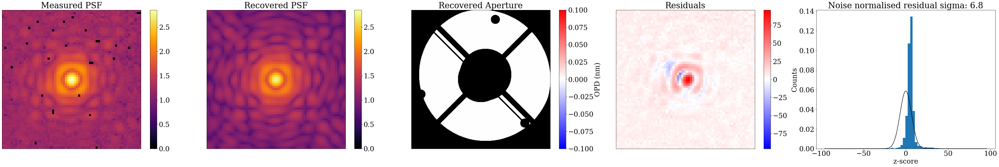

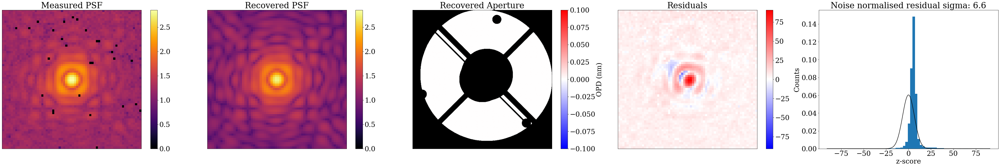

...

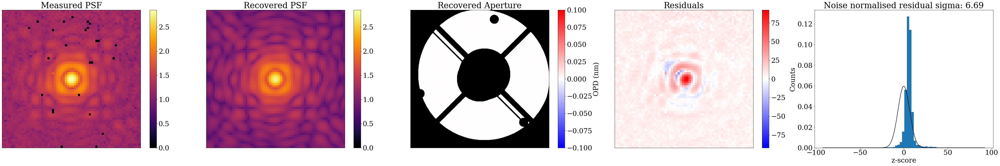

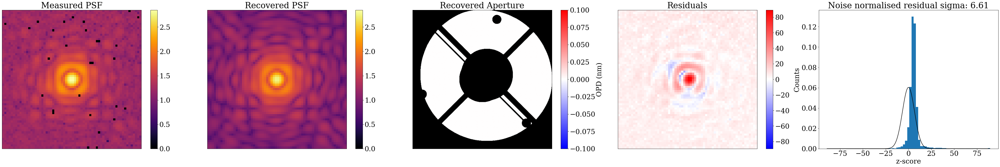

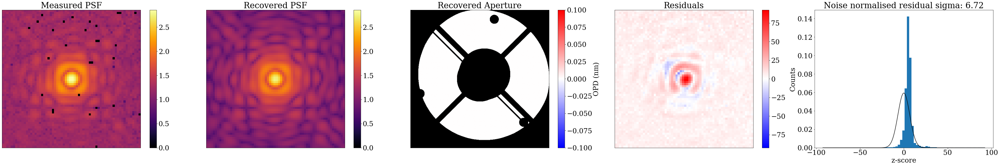

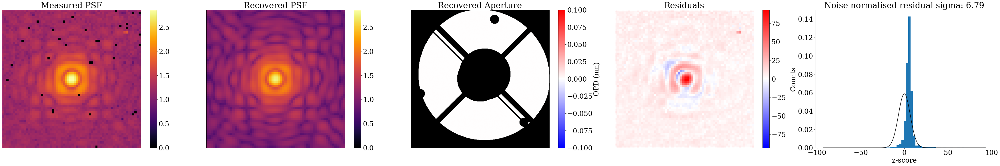

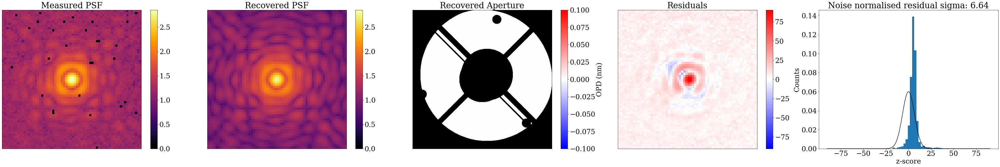

In [11]:
plot_comparison(model_single, params, exposures_single)

In [12]:
exposures_single[0].pam

-0.530879

In [13]:
exposures_single[0].bad[35,60]

Array(False, dtype=bool)

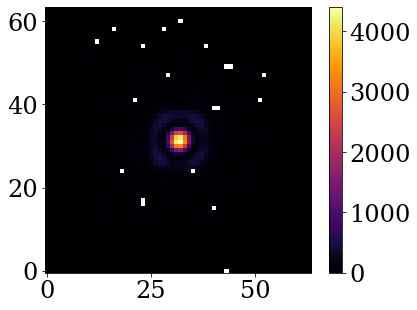

In [14]:
plt.imshow(exposures_single[0].data)
plt.colorbar()

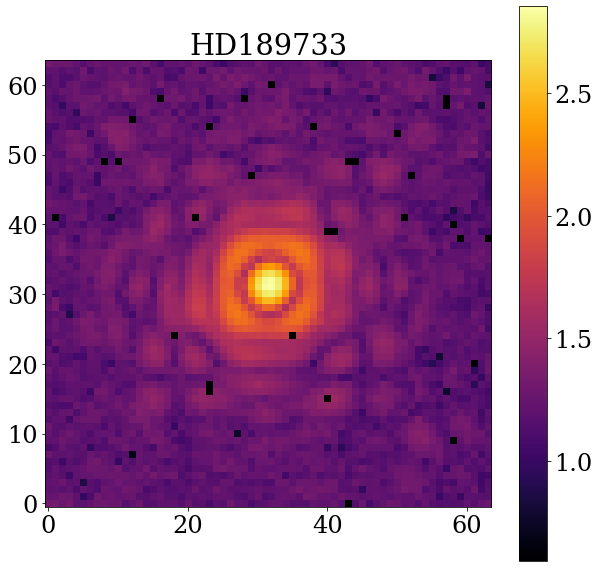

In [15]:
cmap = matplotlib.colormaps['inferno']
cmap.set_bad('k',1)
plt.figure(figsize=(10,10))
plt.imshow(exposures_single[0].data**0.125, cmap=cmap)
plt.title(exposures_single[0].target)
plt.colorbar()


In [16]:
def loss_fn(params, exposures, model):
    mdl = params.inject(model)
    return np.nansum(np.asarray([posterior(mdl,exposure) for exposure in exposures]))

In [17]:
def scheduler(lr, start, *args):
    shed_dict = {start: 1e10}
    for start, mul in args:
        shed_dict[start] = mul
    return optax.piecewise_constant_schedule(lr / 1e10, shed_dict)

base_sgd = lambda vals: optax.sgd(vals, nesterov=True, momentum=0.6)

opt = lambda lr, start, *schedule: base_sgd(scheduler(lr, start, *schedule))

base_adam = lambda vals: optax.adam(vals)
opta = lambda lr, start, *schedule: base_adam(scheduler(lr, start, *schedule))

base_lbfgs = lambda vals: optax.lbfgs(vals)

optl = lambda lr, start, *schedule: base_lbfgs(scheduler(lr, start, *schedule))




def flatten(l):
    if isinstance(l, (tuple, list)):
         return [a for i in l for a in flatten(i)]
    else:
        return [l]



g = 1e-2

things = {
    "positions": opt(g*15, 0),
    "spectrum": opt(g*20, 10),#, (20, 1.5)),
    #"cold_mask_shift": opt(g*100, 45),
    "cold_mask_shift": opt(g*80, 50),
    #"cold_mask_rot": opt(g*10, 100),
    "bias": opt(g*8, 20),
    #"defocus": opt(g*20, 40),
    "despace": opt(g*10, 30),
    "mag": opt(g*10, 80),
    "aberrations": opt(g*1, 60),
}


groups = list(things.keys())
paths = flatten(groups)
optimisers = [things[i] for i in groups]
groups = [list(x) if isinstance(x, tuple) else x for x in groups]

In [18]:
#with jax.profiler.trace("./profile-trace/"):
losses, models = optimise(params, model_single, exposures_single, things, 150, recalculate=True)

Calculating Fishers


  0%|          | 0/20 [00:00<?, ?it/s]

Fitting Model


  0%|          | 0/150 [00:00<?, ?it/s]

In [19]:
losses[-1]

Array(365221.32196456, dtype=float64)

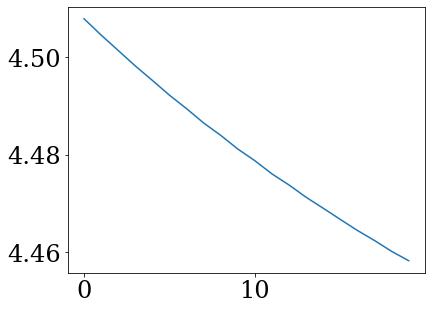

In [20]:
plt.plot(np.asarray(losses[-20:])/(len(exposures_single)*wid**2))

7
2.8017150343595523
2.79374846873703
2.7199707290103055
2.7397959188001444
2.6807558910302025
2.6747927997461103
2.792104268608464
2.6454327182754223
2.7968585113388778
2.7721475620809435
2.791397174012754
2.83178053835659
2.6716455876974297
2.7036513920758827
2.7945466108333754
2.7637392488077985
2.6874409235721393
2.683749648347341
2.7787097595729597


/Users/haydengreer/UQ/Subjects/Semester 2 2024/PHYS3900/hubble/notebooks/../plotting.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1,5, figsize=(50,8))


2.7618875079503975


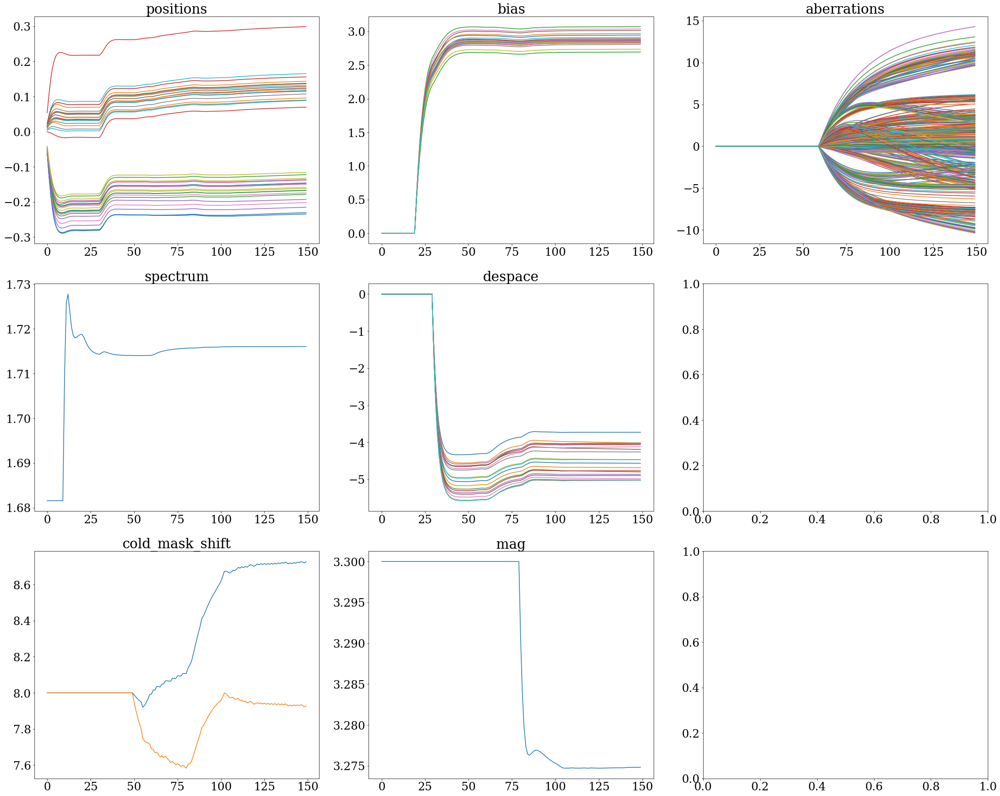

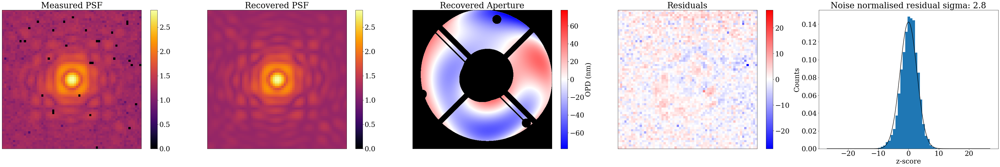

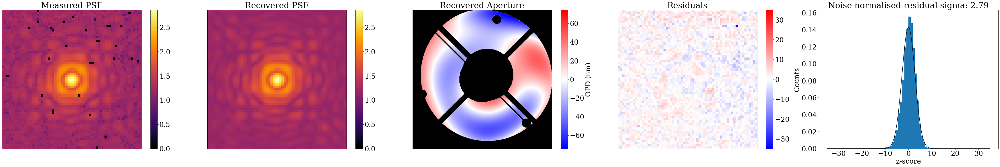

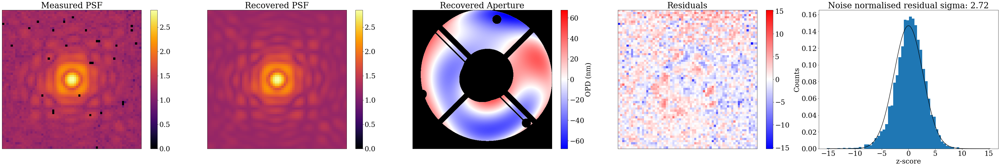

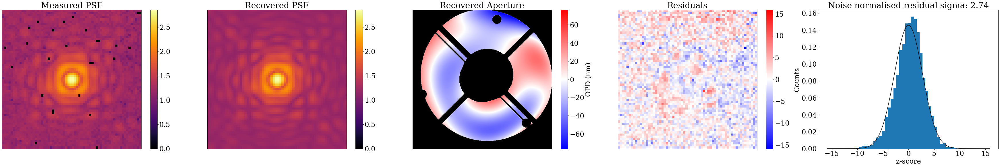

...

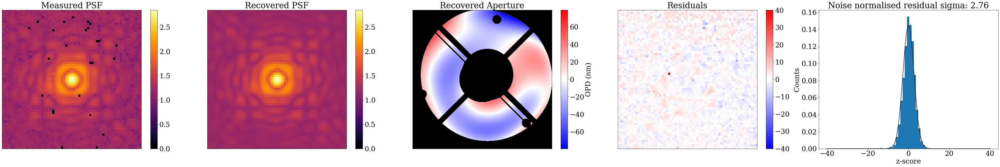

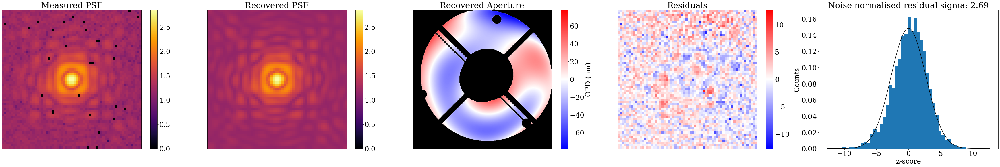

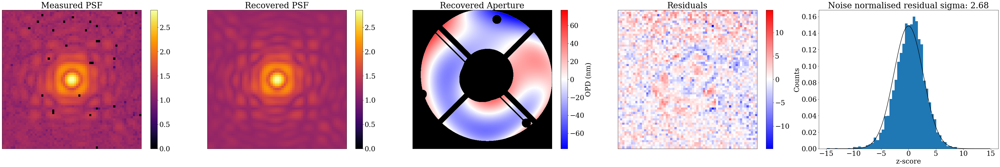

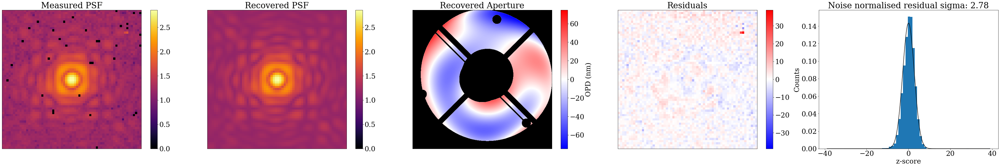

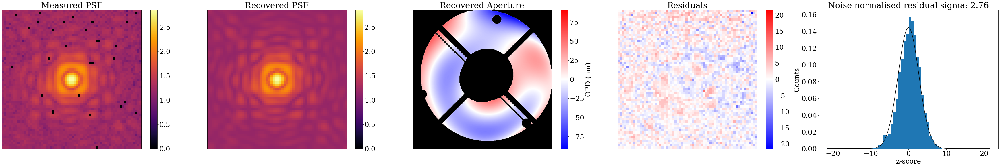

In [21]:
plot_params(models, groups, xw = 3)
plot_comparison(model_single, models[-1], exposures_single)

In [22]:
models[-1].params

{'aberrations': {'na2m01k7q': Array([14.27878448,  0.66485936, -9.23195832, -5.60000972,  0.76906863,
         -7.59061239, 10.01971547,  5.70723154, -0.97090531,  3.49684221,
         -4.90712166, 10.57080656, -2.81579859,  1.36359479,  0.03410917,
          2.19026228, -1.34130149, -4.54038378, -3.73022433,  3.34650423,
          1.3606902 , -0.12999259, -0.59907258,  0.65518402,  2.87341828,
         -3.65424534], dtype=float64),
  'na2m01kcq': Array([14.26673275,  0.02922297, -8.8136702 , -5.42614197,  0.34901565,
         -7.66226776, 10.18358292,  5.63953517, -1.33205823,  2.91304143,
         -5.17177657, 10.96952869, -3.14334738,  1.68917085,  0.05458483,
          2.55588076, -1.06860482, -4.48760331, -3.00162659,  3.76491517,
          1.77980431, -0.18133209, -0.78118759,  0.65112556,  4.00793728,
         -3.54777995], dtype=float64),
  'na2m01kiq': Array([13.06037422,  0.36343789, -8.80458368, -5.9536028 ,  0.78187981,
         -7.60297019, 10.10480417,  5.73910172, -1.441

In [23]:
def loss_fn(params, exposures, model):
    mdl = params.inject(model)
    res = np.sum(np.asarray([posterior(mdl,exposure) for exposure in exposures]))
    return np.where(res==0.0, np.inf, res)

@eqx.filter_jit
def fun(params, args):
    exposures, model = args
    return loss_fn(params, exposures, model)

def optimise_optimistix(params, model, exposures, things, niter):
    paths = list(things.keys())
    optimisers = [things[i] for i in paths]

    model_params = ModelParams({p: params.get(p) for p in things.keys()})

    solver = optx.BFGS(rtol=1e-6, atol=1e-6,verbose=frozenset({"step_size", "loss"}))
    sol = optx.minimise(fun, solver, model_params, (exposures, model), throw=False, max_steps=niter)
    
    return sol



In [24]:
sol = optimise_optimistix(models[-1], models[-1].inject(model_single), exposures_single, things, 5000)
print(sol.value.params)
final_params = sol.value
#final_params = models[-1]
print(fun(sol.value, (exposures_single, model_single)), (losses[-1]))

Loss on this step: 365044.9313705472, Loss on the last accepted step: 0.0, Step size: 1.0
Loss on this step: inf, Loss on the last accepted step: 365044.9313705472, Step size: 0.5
Loss on this step: inf, Loss on the last accepted step: 365044.9313705472, Step size: 0.25
Loss on this step: inf, Loss on the last accepted step: 365044.9313705472, Step size: 0.125
Loss on this step: inf, Loss on the last accepted step: 365044.9313705472, Step size: 0.0625
Loss on this step: inf, Loss on the last accepted step: 365044.9313705472, Step size: 0.03125
Loss on this step: inf, Loss on the last accepted step: 365044.9313705472, Step size: 0.015625
Loss on this step: inf, Loss on the last accepted step: 365044.9313705472, Step size: 0.0078125
Loss on this step: 1.2931062159446464e+166, Loss on the last accepted step: 365044.9313705472, Step size: 0.00390625
Loss on this step: 6.433163288392971e+86, Loss on the last accepted step: 365044.9313705472, Step size: 0.001953125
Loss on this step: 1.14422

2.7328621258252905
2.730649942795348
2.6591979122785405
2.672230803413282
2.612013820992565
2.6027995304758433
2.714544569107096
2.574520850286981
2.73106036648914
2.7026609226951464
2.7271560893293274
2.7587372984382452
2.5972280894653825
2.6412256252855673
2.726313551732849
2.69350364410378
2.6132020381771346
2.6103517915624495
2.7094367829485075
2.6976734329723437


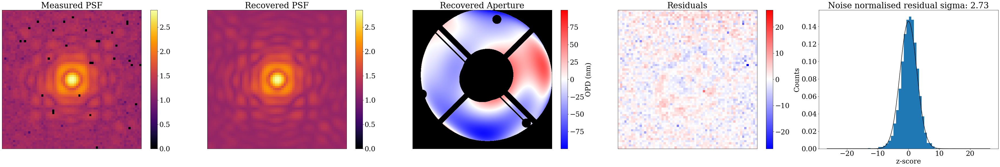

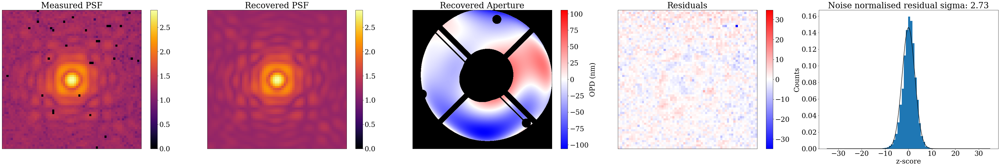

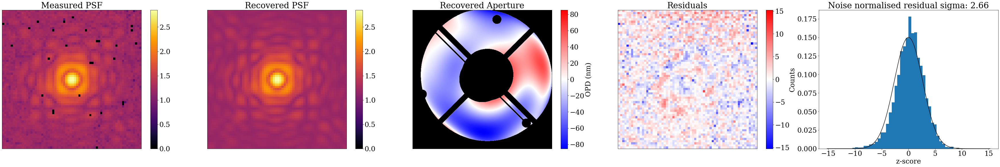

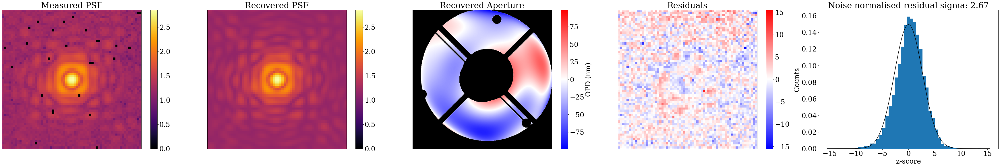

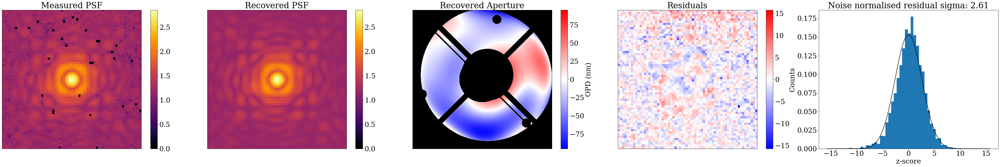

...

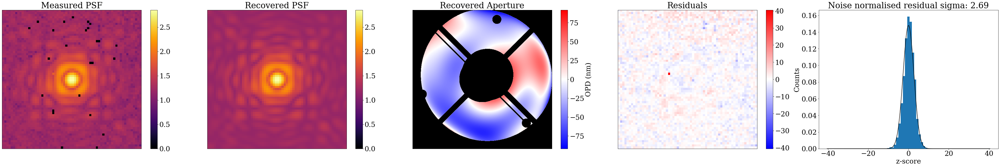

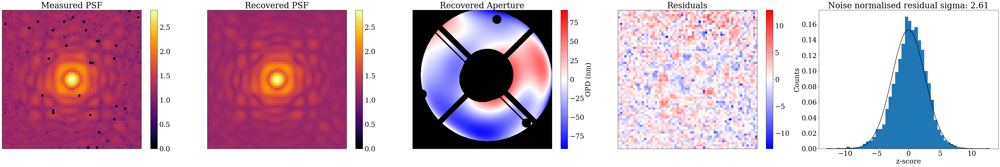

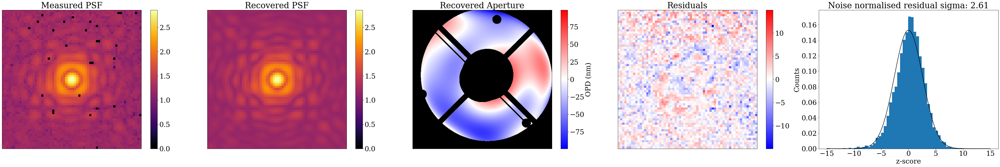

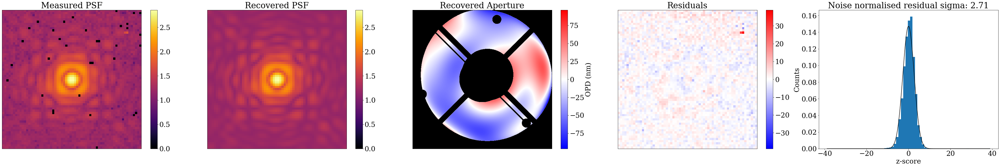

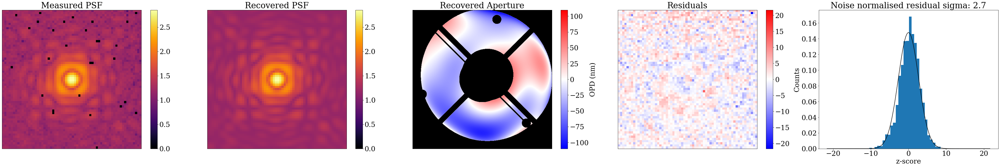

In [25]:
plot_comparison(final_params.inject(models[-1].inject(model_single)), final_params, exposures_single)

In [26]:
exposures_raw[0].filter

'F187N'

In [27]:
models[-1].params

{'aberrations': {'na2m01k7q': Array([14.27878448,  0.66485936, -9.23195832, -5.60000972,  0.76906863,
         -7.59061239, 10.01971547,  5.70723154, -0.97090531,  3.49684221,
         -4.90712166, 10.57080656, -2.81579859,  1.36359479,  0.03410917,
          2.19026228, -1.34130149, -4.54038378, -3.73022433,  3.34650423,
          1.3606902 , -0.12999259, -0.59907258,  0.65518402,  2.87341828,
         -3.65424534], dtype=float64),
  'na2m01kcq': Array([14.26673275,  0.02922297, -8.8136702 , -5.42614197,  0.34901565,
         -7.66226776, 10.18358292,  5.63953517, -1.33205823,  2.91304143,
         -5.17177657, 10.96952869, -3.14334738,  1.68917085,  0.05458483,
          2.55588076, -1.06860482, -4.48760331, -3.00162659,  3.76491517,
          1.77980431, -0.18133209, -0.78118759,  0.65112556,  4.00793728,
         -3.54777995], dtype=float64),
  'na2m01kiq': Array([13.06037422,  0.36343789, -8.80458368, -5.9536028 ,  0.78187981,
         -7.60297019, 10.10480417,  5.73910172, -1.441

In [28]:
models[-1]["despace"]

{'na2m01k7q': Array(-3.72674556, dtype=float64),
 'na2m01kcq': Array(-4.01795018, dtype=float64),
 'na2m01kiq': Array(-4.01655004, dtype=float64),
 'na2m01knq': Array(-4.05558671, dtype=float64),
 'na2m01ksq': Array(-4.03556543, dtype=float64),
 'na2m01kyq': Array(-4.189138, dtype=float64),
 'na2m01l3q': Array(-4.11766688, dtype=float64),
 'na2m01l8q': Array(-4.25869672, dtype=float64),
 'na2m01leq': Array(-4.46690227, dtype=float64),
 'na2m01ljq': Array(-4.46571554, dtype=float64),
 'na2m01loq': Array(-4.56342595, dtype=float64),
 'na2m01luq': Array(-4.68085235, dtype=float64),
 'na2m01lzq': Array(-4.79712622, dtype=float64),
 'na2m01m4q': Array(-4.76618887, dtype=float64),
 'na2m01maq': Array(-4.86253641, dtype=float64),
 'na2m01mfq': Array(-4.89336712, dtype=float64),
 'na2m01mkq': Array(-4.98060138, dtype=float64),
 'na2m01mqq': Array(-5.02222711, dtype=float64),
 'na2m01mvq': Array(-5.01557102, dtype=float64),
 'na2m01n0q': Array(-5.0131988, dtype=float64)}

In [29]:
#calc_fishers(models[-1].inject(model_single), exposures_single, ["fnumber"], fisher_fn, recalculate=True, save=False)

In [30]:
np.sqrt(1/7395.6)

Array(0.01162822, dtype=float64, weak_type=True)

In [31]:
fsh = calc_fishers(models[-1].inject(model_single), exposures_single, ["despace"], fisher_fn, recalculate=True, save=False)

  0%|          | 0/20 [00:00<?, ?it/s]

In [32]:
1/np.sqrt(list(fsh.values())[0].flatten()[0])

Array(0.02832756, dtype=float64)

In [33]:
defocuses = [x for x in models[-1].params["despace"].values()]
errs = [np.sqrt(1/float(x.flatten()[0])) for x in fsh.values()]
mjds = [exp.mjd for exp in exposures_single]
print(mjds)
mins= [(x - mjds[0])*24*60 for x in mjds]


[54571.66436884, 54571.66512112, 54571.66587344, 54571.66662577, 54571.66737807, 54571.66813038, 54571.66888272, 54571.66963501, 54571.67038733, 54571.67113967, 54571.67189196, 54571.67264429, 54571.67339664, 54571.67414894, 54571.67490127, 54571.67565362, 54571.67640591, 54571.67715823, 54571.67791057, 54571.67866286]


In [34]:
np.asarray([x for x in models[-1].params["cold_mask_shift"].values()])

Array([[8.72620277, 7.92780856]], dtype=float64)

In [35]:
np.asarray([x for x in models[-1].params["spectrum"].values()])

Array([1.71605821], dtype=float64)

Text(0, 0.5, 'Despace (µm)')

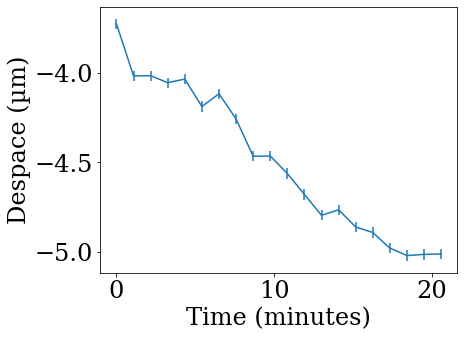

In [36]:
plt.errorbar(mins, defocuses, np.squeeze(np.asarray(errs)))
plt.xlabel("Time (minutes)")
plt.ylabel("Despace (µm)")

In [37]:
import pandas as pd
model = pd.read_csv("focus15.txt", sep=", ")[1:]

/var/folders/hv/659ls99s2sjd7m3dfr17k8cm0000gn/T/ipykernel_26051/1992208873.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  model = pd.read_csv("focus15.txt", sep=", ")[1:]


In [38]:
import interpax as ipx

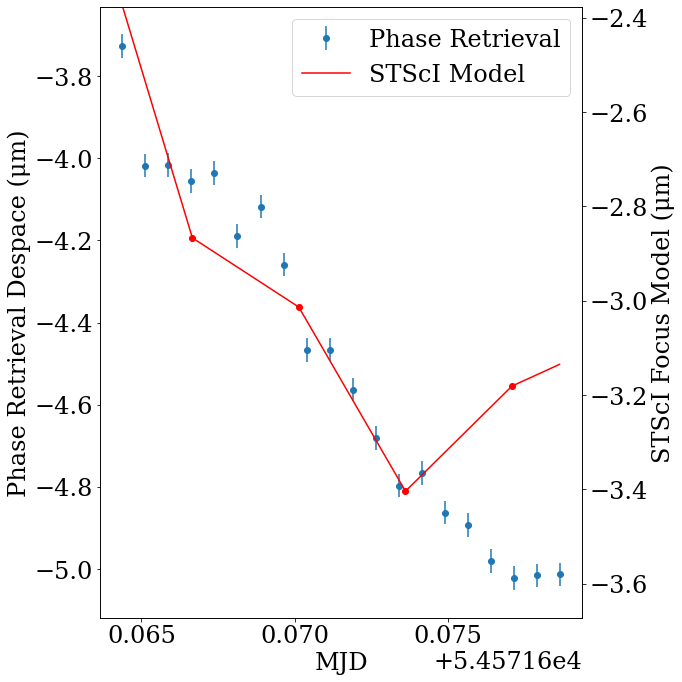

In [42]:
mjds_nacho = np.array(mjds)
defocus_nacho = np.array(defocuses)
err_nacho = np.array(errs)

mjds_st = model["Julian Date"].to_numpy()
msk = (mjds_st > np.min(mjds_nacho)) & (mjds_st < np.max(mjds_nacho))
defocus_st = model["Model"].to_numpy()

mjds_interpd = np.linspace(mjds_st.min(), mjds_st.max(), 10000)
defocus_interpd = ipx.interp1d(mjds_interpd, mjds_st, defocus_st, "linear")
msk_interpd = (mjds_interpd > np.min(mjds_nacho)) & (mjds_interpd < np.max(mjds_nacho))

rang = np.max(defocus_nacho)-np.min(defocus_nacho)

top = np.max(defocus_interpd[msk_interpd])

fig, ax1 = plt.subplots(figsize=(10,10))
ax1.errorbar(mjds_nacho, defocus_nacho, yerr=err_nacho, fmt="o", label="Phase Retrieval")
ax2 = ax1.twinx()
ax2.scatter(mjds_st[msk], defocus_st[msk], color="r")
ax2.plot(mjds_interpd[msk_interpd], defocus_interpd[msk_interpd], color="r", label="STScI Model")
ax2.set_ylim(top-rang, top)
ax1.set_xlabel("MJD")
ax1.set_ylabel("Phase Retrieval Despace (μm)")
ax2.set_ylabel("STScI Focus Model (μm)")
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=0)
plt.tight_layout()

In [40]:
abb = np.zeros((len(exposures_single), n_zernikes+1))
abb = abb.at[:,1:].set(np.asarray([x for x in models[-1].params["aberrations"].values()]))#.transpose()
abb = abb.at[:,0].set(np.asarray([float(x) for x in models[-1].params["despace"].values()]))
print(abb.shape)

pca = PCA(n_components=5)
pca.fit(abb)
print(pca.singular_values_)
print(pca.components_)
print(pca.explained_variance_)
components = pca.components_

(20, 27)
[10.63059857  5.03797536  2.91632026  2.7425695   2.00750237]
[[-0.16209037 -0.25108439  0.77788462 -0.17481512 -0.38632725  0.06078463
  -0.10255783  0.08884859 -0.08186809  0.05137647  0.10723943  0.05224462
  -0.05546534 -0.11545637 -0.06284031  0.04656787 -0.04176228  0.05453431
   0.04081     0.03841789 -0.15670962 -0.04851306 -0.0125694   0.00848813
   0.07241072 -0.08836252  0.09754428]
 [ 0.06050654  0.63426846  0.3193013   0.10124397  0.38514024  0.03873234
  -0.10435507  0.0665927  -0.13475258 -0.19566375  0.09203691 -0.07717373
  -0.21483127 -0.22376825 -0.15400946  0.02798597 -0.0796165  -0.03403938
   0.00545947 -0.26060637 -0.11451967 -0.08726463 -0.08374942  0.07628769
   0.06225027 -0.03257174 -0.1055579 ]
 [ 0.09074505 -0.06802975 -0.05233326 -0.08253795 -0.11962304  0.03349119
   0.11977048  0.65812037  0.17242477  0.12375535  0.08218702 -0.01339
  -0.21673198  0.18089156  0.04150705  0.03794358 -0.13842109  0.06899874
  -0.06596988 -0.23203504 -0.02069335  0

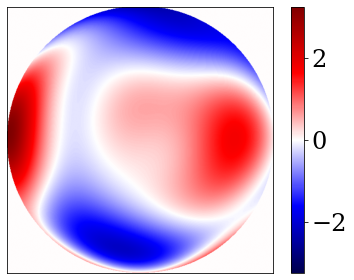

In [41]:
ap = dl.AberratedAperture(dl.CircularAperture(radius=1.2), noll_inds=np.arange(4,4+n_zernikes+1), coefficients=components[0])
coords = dlu.pixel_coords(512, 2.4)

opd = ap.eval_basis(coords)#*1e9
m = np.max(np.abs(opd))
plt.imshow(opd, cmap='seismic', vmin=-m, vmax=m)
plt.xticks([])
plt.yticks([])
plt.colorbar()
